<a href="https://colab.research.google.com/github/meenugigi/Bike-Rental-Analysis/blob/main/BikeRentalAnalysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


import warnings
warnings.filterwarnings('ignore')
import statsmodels
# import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import RFE
from sklearn.metrics import r2_score
pd.set_option('display.float_format', lambda x:'%.5f' % x)
from pandas_profiling import ProfileReport

data = pd.read_csv("/content/day.csv")
data.head()

,instant,dteday,season,yr,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,2011-01-01,1,0,1,0,6,0,2,0.34417,0.36362,0.80583,0.16045,331,654,985
1,2,2011-01-02,1,0,1,0,0,0,2,0.36348,0.35374,0.69609,0.24854,131,670,801
2,3,2011-01-03,1,0,1,0,1,1,1,0.19636,0.18940,0.43727,0.24831,120,1229,1349
3,4,2011-01-04,1,0,1,0,2,1,1,0.20000,0.21212,0.59044,0.16030,108,1454,1562
4,5,2011-01-05,1,0,1,0,3,1,1,0.22696,0.22927,0.43696,0.18690,82,1518,1600


In [ ]:
data.info()
data.shape

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 731 entries, 0 to 730
Data columns (total 16 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   instant     731 non-null    int64  
 1   dteday      731 non-null    object 
 2   season      731 non-null    int64  
 3   yr          731 non-null    int64  
 4   mnth        731 non-null    int64  
 5   holiday     731 non-null    int64  
 6   weekday     731 non-null    int64  
 7   workingday  731 non-null    int64  
 8   weathersit  731 non-null    int64  
 9   temp        731 non-null    float64
 10  atemp       731 non-null    float64
 11  hum         731 non-null    float64
 12  windspeed   731 non-null    float64
 13  casual      731 non-null    int64  
 14  registered  731 non-null    int64  
 15  cnt         731 non-null    int64  
dtypes: float64(4), int64(11), object(1)
memory usage: 91.5+ KB


(731, 16)

In [ ]:
len(data[data.duplicated()])

0

In [ ]:
# weathersit
data['weathersit'] = data['weathersit'].map({1:'Clear to Partly Cloudy', 2:'Misty and Cloudy', 3:'Light Rain with Thunderstorm and Snow', 4:'Heavy Rain with Thunderstom, Snow and Fog'})

In [ ]:
# season
data['season'] = data['season'].map({1: 'Winter', 2:'Spring', 3:'Summer', 4:'Fall'})

In [ ]:
# month of the year
data['mnth'] = data['mnth'].map({1:'Jan', 2:'Feb', 3:'Mar', 4:'Apr', 5:'May', 6:'Jun', 7:'Jul', 8:'Aug', 9:'Sep', 10:'Oct', 11:'Nov', 12:'Dec'})

In [ ]:
# days of the week
data['weekday'] = data['weekday'].map({0:'Sun', 1:'Mon', 2:'Tue', 3:'Wed', 4:'Thu', 5:'Fri', 6:'Sat'})

In [ ]:
# year
data['yr'] = data['yr'].map({0:'2011', 1:'2012'})

In [ ]:
# working day
data['workingday'] = data['workingday'].map({0:'Holiday or Weekend', 1:'Workingday'})

In [ ]:
# holidays
data['holiday'] = data['holiday'].map({0:'No', 1:'Yes'})

In [ ]:
data.head()

,instant,dteday,season,yr,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,2011-01-01,Winter,2011,Jan,No,Sat,Holiday or Weekend,Misty and Cloudy,0.34417,0.36362,0.80583,0.16045,331,654,985
1,2,2011-01-02,Winter,2011,Jan,No,Sun,Holiday or Weekend,Misty and Cloudy,0.36348,0.35374,0.69609,0.24854,131,670,801
2,3,2011-01-03,Winter,2011,Jan,No,Mon,Workingday,Clear to Partly Cloudy,0.19636,0.18940,0.43727,0.24831,120,1229,1349
3,4,2011-01-04,Winter,2011,Jan,No,Tue,Workingday,Clear to Partly Cloudy,0.20000,0.21212,0.59044,0.16030,108,1454,1562
4,5,2011-01-05,Winter,2011,Jan,No,Wed,Workingday,Clear to Partly Cloudy,0.22696,0.22927,0.43696,0.18690,82,1518,1600


In [ ]:
# Analyzing the count of total rented bikes
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(12,5))

sns.boxplot(y=data['cnt'], ax= ax[0], palette='Purples')
ax[0].set_title("Boxplot showing basic statistics for Count of Total Rental Bikes")
ax[0].set_ylabel(' ')
ax[0].set_xlabel(' ')

sns.distplot(data['cnt'], ax= ax[1], kde_kws={'lw': 5}, color='blue')
ax[1].set_title("Graph showing the distribution of the Count of Total Rental Bikes")
ax[1].set_ylabel(' ')
ax[1].set_xlabel(' ')

plt.tight_layout()
plt.show()


# Analysis:
# The Distribution graph illustrates that the Count of Total Rental Bikes seems to be normally distributed.

# The Boxplot shows that the median for the Count of Total Rental Bikes lie somewhere around 4500.
# The first Quartile Q1 lies above 3000 and the third quartile Q3 lies somewhere around 60000.

In [ ]:
const_vars = [i for i in data.select_dtypes(exclude = 'object').columns if data[i].nunique() > 2 and i!='instant']

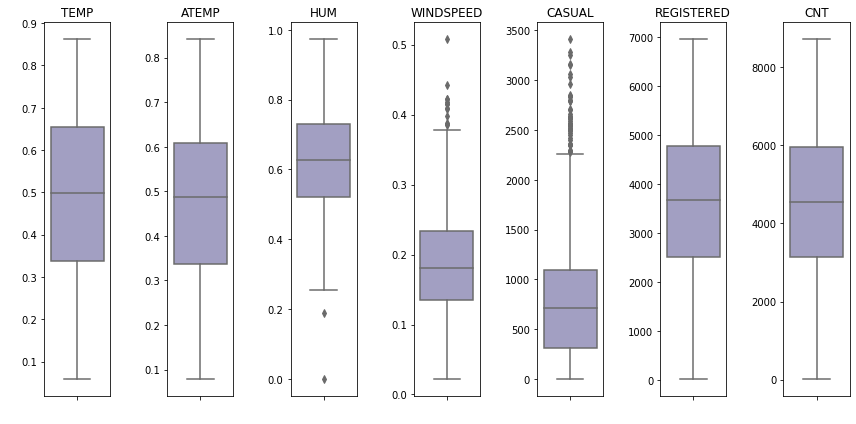

In [ ]:
# Boxplots to showing the weather statistics

fig, ax= plt.subplots(nrows=1, ncols=len(const_vars), figsize=(12,6))
for i in range(len(const_vars)):
  sns.boxplot(y=data[const_vars[i]], ax=ax[i], palette="Purples")
  ax[i].set_title(f'{const_vars[i].upper()}')
  ax[i].set_ylabel(' ')
  ax[i].set_xlabel(' ')


plt.tight_layout()
plt.show()

# Analysis:
# Temp: Q1 lies somewhere around 0.35 and Q3 around 0.65. The median is around 0.5.
# Feeling temp: Q1 lies somewhere around 0.35 and Q3 around 0.6. The median is around 0.5.
# Humidity: Q1 lies somewhere above 0.5 and Q3 above 0.7. The median is above 0.6.
# Windspeed: Q1 lies somewhere around 0.15 and Q3 below 0.25. The median is around 0.18.
# Casual: Q1 lies somewhere around 300 and Q3 around 1100. The median is around 750.
# Registered: Q1 lies somewhere around 2500 and Q3 around 4800. The median is around 3800.

# Humidity, Windspeed and Casual show the presence of outliners

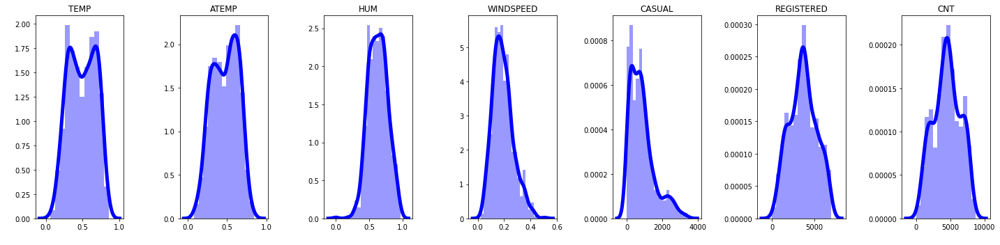

In [ ]:
fig, ax= plt.subplots(nrows=1, ncols=len(const_vars), figsize=(20,5))
for i in range(len(const_vars)):
  sns.distplot(data[const_vars[i]], ax=ax[i], kde_kws={'lw': 5}, color='blue')
  ax[i].set_title(f'{const_vars[i].upper()}')
  ax[i].set_ylabel(' ')
  ax[i].set_xlabel(' ')


plt.tight_layout()
plt.show()

# Analysis:
# Temperature and feeling termperature show bimodel distribution of data.
# Humidity is right skewed whereas windspeed is left skewed.
# Casual shows high right skew in data.
# Registered and CNT show a normalized distribtion of data.

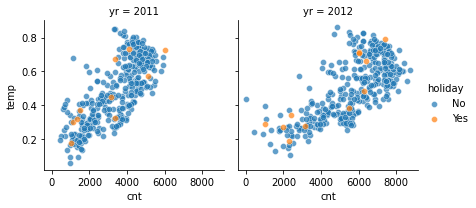

In [ ]:

g = sns.FacetGrid(data, col="yr", hue="holiday")
g.map(sns.scatterplot, "cnt", "temp", alpha=.7)
g.add_legend()


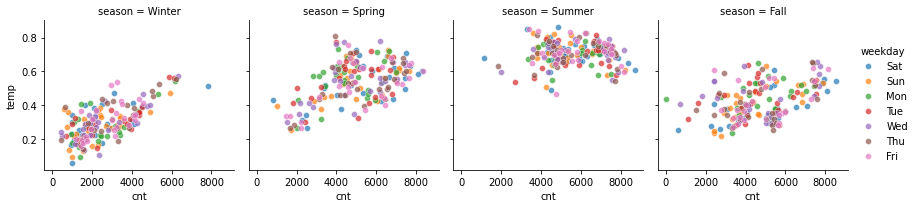

In [ ]:
g = sns.FacetGrid(data, col="season", hue="weekday")
g.map(sns.scatterplot, "cnt", "temp", alpha=.7)
g.add_legend()

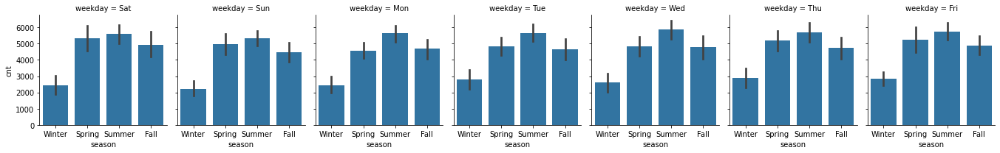

In [ ]:
# count of total rented bikes for every day of each season
g = sns.FacetGrid(data, col="weekday", height=3, aspect=.9)
g.map(sns.barplot, "season", "cnt", order=["Winter", "Spring", "Summer", "Fall"])

# Analysis:
# The total count of bike rentals is the highest for each day in summer.
# Rentals are high on the Thursday, Friday, Saturday and Sunday of Spring.
# Rental counts are the lowest in Winter.

In [ ]:
categor_var = [i for i in data.select_dtypes(include = 'object').columns]

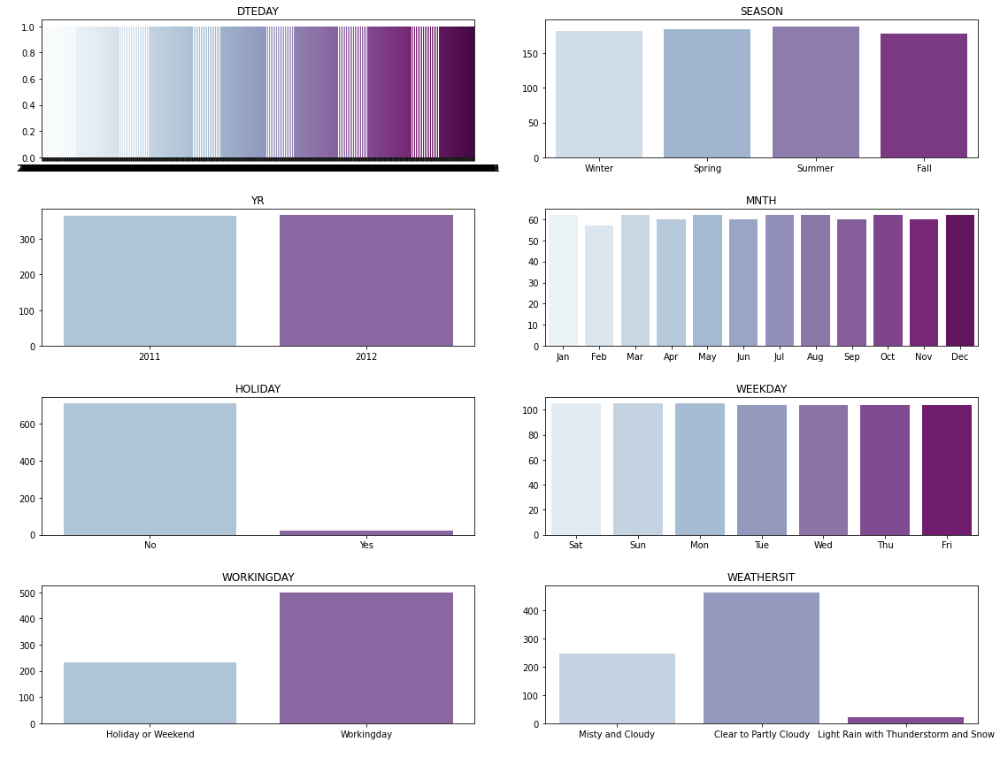

In [ ]:
fig, ax = plt.subplots(nrows = 4, ncols = int(len(categor_var)/4), figsize=(16,12))

k=0

for i in range(4):
  for j in range(int(len(categor_var)/4)):
    sns.countplot(data[categor_var[k]], ax = ax[i,j], palette="BuPu")

    ax[i,j].set_title(f'{categor_var[k].upper()}')
    ax[i,j].set_ylabel(' ')
    ax[i,j].set_xlabel(' ')

    k=k+1

plt.tight_layout()
plt.show()


# Analysis
# Data distribution shows that Summer is the longest season followed by Spring, Winter and Fall.
# Weather shows only 3 types of data which means that there has not been a single day of heavy rain, thunderstorm and snow in the year 2011 and 2012.
# The weather has been mostly clear or partly cloudy for most of the days. 
# There have been very few days of light rainfall, snow and thunderstorm in the years 2011 and 2012.

In [ ]:
const_vars = [i for i in data.select_dtypes(exclude = 'object').columns if data[i].nunique() > 2 and i!='instant' and i!='casual' and i!='registered']


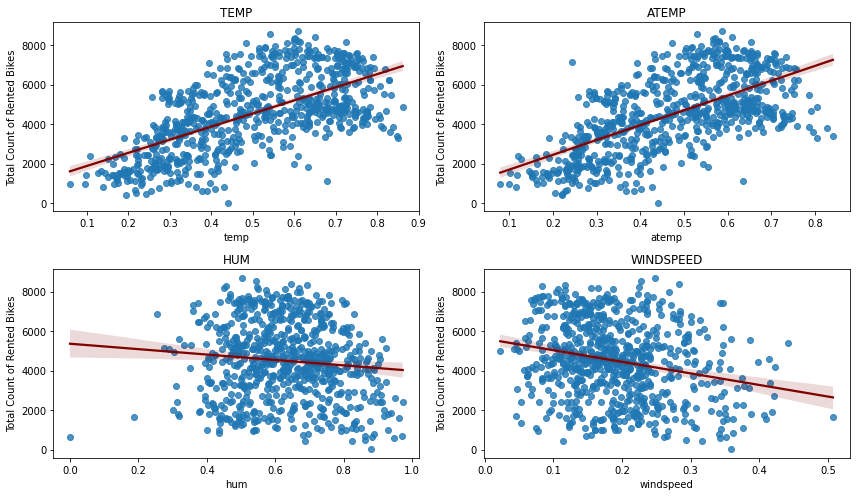

In [ ]:
fig, ax = plt.subplots(nrows = 2, ncols = int(len(const_vars)/2), figsize=(12,7))

k=0

for i in range(2):
  for j in range(int(len(const_vars)/2)):
    sns.regplot(x=data[const_vars[k]], y=data['cnt'], ax=ax[i,j], line_kws={'color': 'maroon'})

    ax[i,j].set_title(f'{const_vars[k].upper()}')
    ax[i,j].set_ylabel('Total Count of Rented Bikes')
    ax[i,j].set_xlabel(f'{const_vars[k]}')

    k=k+1

plt.tight_layout()
plt.show()

# Analysis:
# The total count of bike rentals shows direct proportion to the termp and feleing temperature as well as the casual and registered data.
# The total count of bike rentals is inversely proportional to humidity and windspeed.

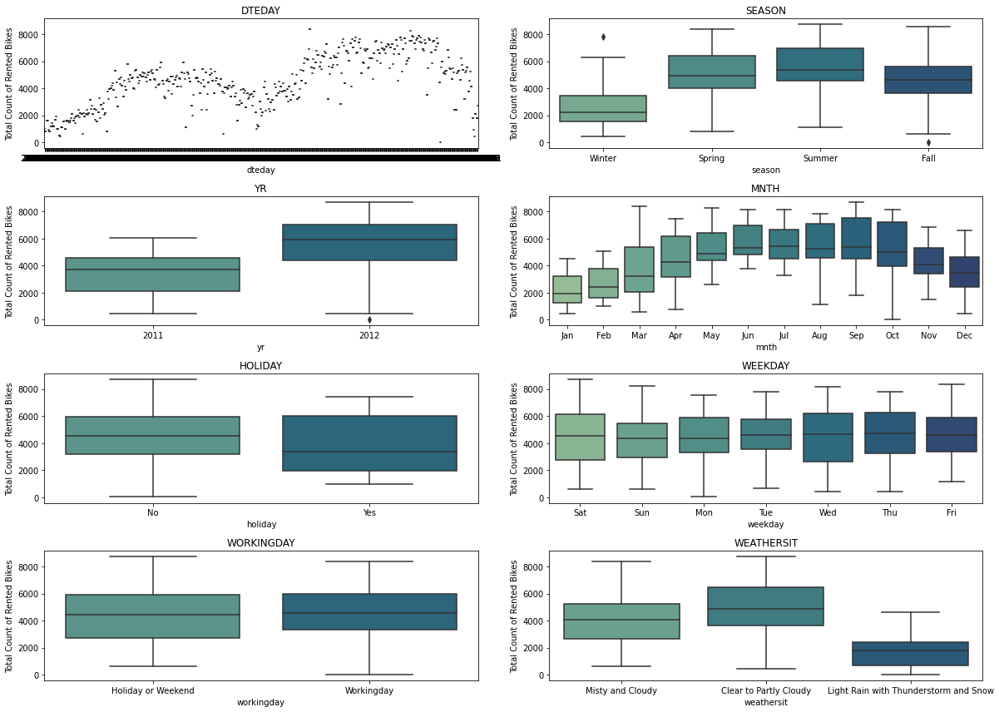

In [ ]:
# Visualizing categorical variables
fig, ax = plt.subplots(nrows = 4, ncols = int(len(categor_var)/4), figsize=(17,12))

k=0

for i in range(4):
  for j in range(int(len(categor_var)/4)):
    sns.boxplot(x=data[categor_var[k]], y=data['cnt'], ax=ax[i,j], palette='crest')

    ax[i,j].set_title(f'{categor_var[k].upper()}')
    ax[i,j].set_ylabel('Total Count of Rented Bikes')
    ax[i,j].set_xlabel(f'{categor_var[k]}')
    

    k=k+1

plt.tight_layout()
plt.show()

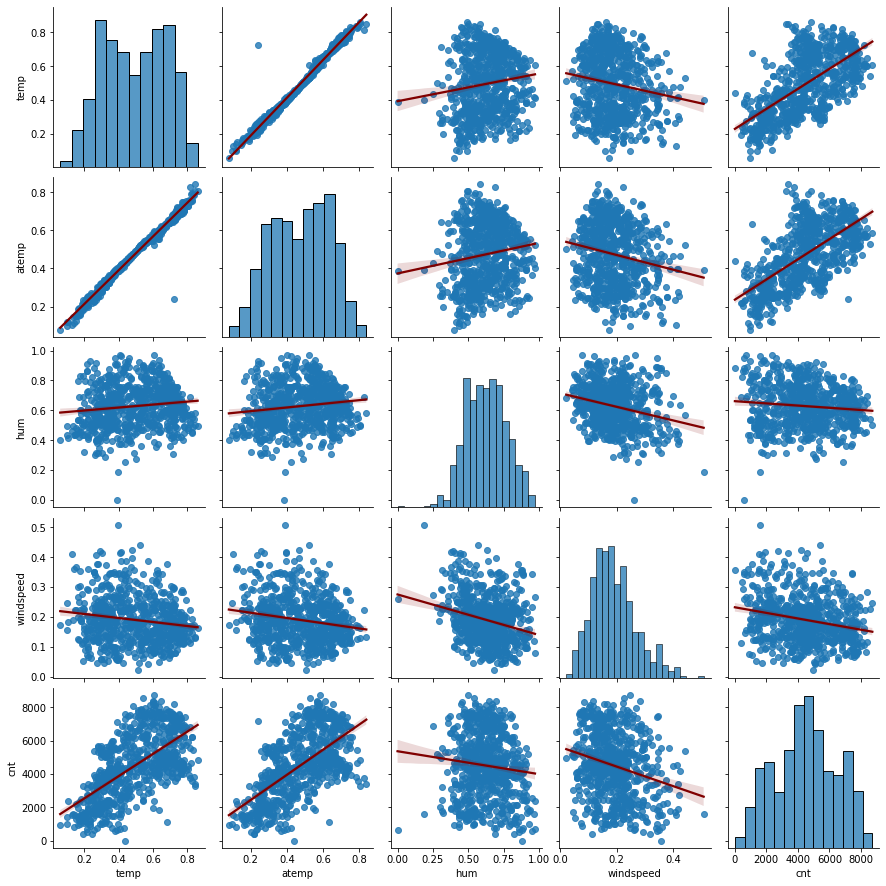

In [ ]:
# Visualizing the continous variables
df = data.drop(columns = ['dteday', 'instant', 'yr', 'mnth', 'holiday','weekday', 'workingday','registered', 'casual'])
g=sns.pairplot(df, kind='reg', plot_kws={'line_kws':{'color':'maroon'}})



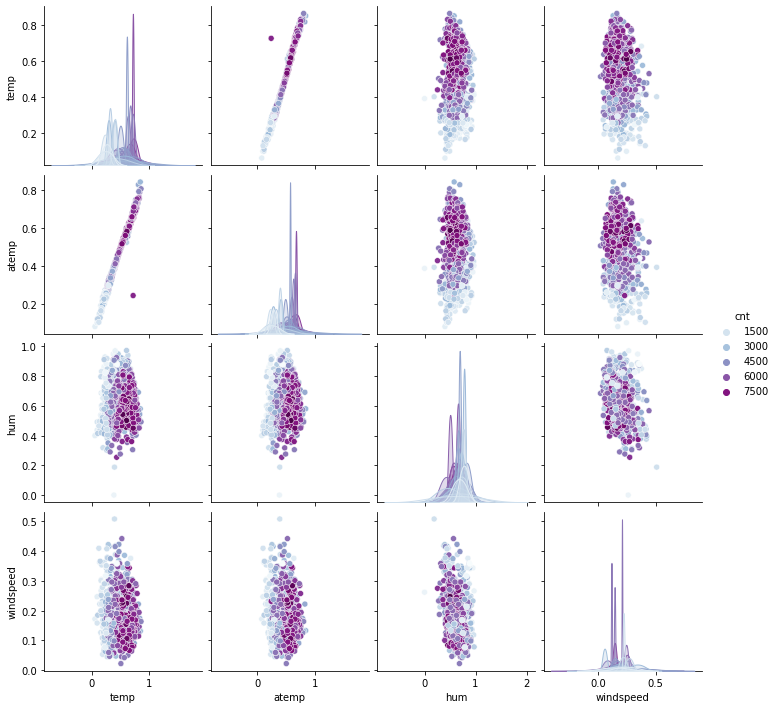

In [ ]:
df = data.drop(columns = ['dteday', 'instant', 'yr', 'mnth', 'holiday','weekday', 'workingday','registered', 'casual'])
sns.pairplot(df, hue = 'cnt', palette='BuPu')

In [ ]:
weather_var = ['temp','atemp','hum', 'windspeed']

NameError: ignored

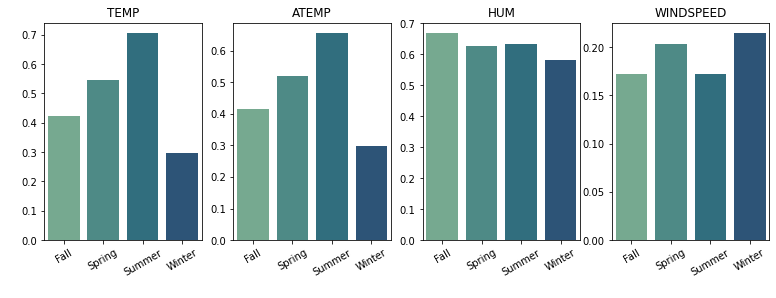

In [ ]:
fig, ax= plt.subplots(nrows=1, ncols=len(weather_var), figsize=(13,4))
for i in range(len(weather_var)):
  sns.barplot(y=data.groupby(by='season').mean()[weather_var[i]],
              x=data.groupby(by='season').mean().index,
              ax=ax[i], palette='crest')
  ax[i].set_title(f'{weather_var[i].upper()}')
  ax[i].set_ylabel(' ')
  ax[i].set_xlabel(' ')
  ax[i].set_xticklabels(ax[i].get_xticklabels(),rotation = 30)
  
change_width(ax, .25)

plt.tight_layout()
plt.show()

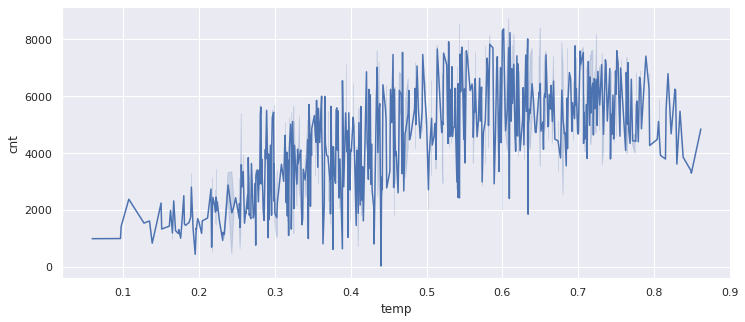

In [ ]:
sns.set(rc={"figure.figsize":(12, 5)})
sns.lineplot(data=data, x="temp", y="cnt")

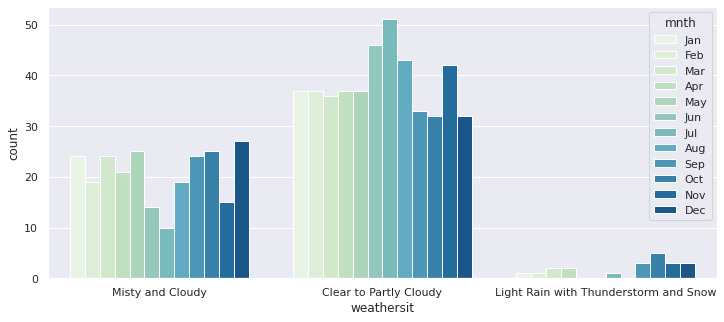

In [ ]:
sns.countplot('weathersit', data=data, hue='mnth', palette='GnBu');


In [ ]:
monthlydata = data.groupby(['mnth'], sort=False)[['atemp', 'temp', 'hum', 'windspeed']].mean()
monthlydata.head(60)

,atemp,temp,hum,windspeed
mnth,,,,
Jan,0.23980,0.23644,0.58583,0.20630
Feb,0.29973,0.29923,0.56746,0.21568
Mar,0.38195,0.39054,0.58848,0.22270
Apr,0.45708,0.47000,0.58806,0.23448
May,0.56566,0.59480,0.68896,0.18299
Jun,0.63825,0.68410,0.57581,0.18542
Jul,0.70409,0.75547,0.59788,0.16606
Aug,0.65147,0.70858,0.63773,0.17292
Sep,0.57930,0.61648,0.71471,0.16595


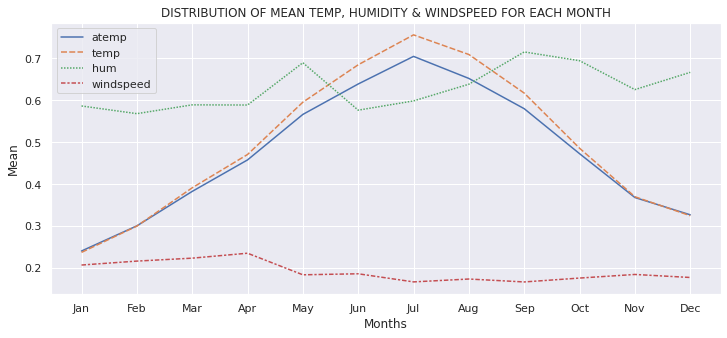

In [ ]:
sns.set(rc={"figure.figsize":(12, 5)})
sns.lineplot(data=monthlydata)
plt.xlabel("Months")
plt.ylabel("Mean")
plt.title("DISTRIBUTION OF MEAN TEMP, HUMIDITY & WINDSPEED FOR EACH MONTH")
plt.show()

In [ ]:
casualreg = data.groupby(['mnth'], sort=False)[['casual', 'registered', 'cnt']].mean()
casualreg.head(60)

,casual,registered,cnt
mnth,,,
Jan,194.22581,1982.11290,2176.33871
Feb,262.50877,2392.78947,2655.29825
Mar,716.83871,2975.41935,3692.25806
Apr,1013.36667,3471.53333,4484.90000
May,1214.27419,4135.50000,5349.77419
Jun,1231.76667,4540.60000,5772.36667
Jul,1260.59677,4303.08065,5563.67742
Aug,1161.91935,4502.50000,5664.41935
Sep,1172.05000,4594.46667,5766.51667


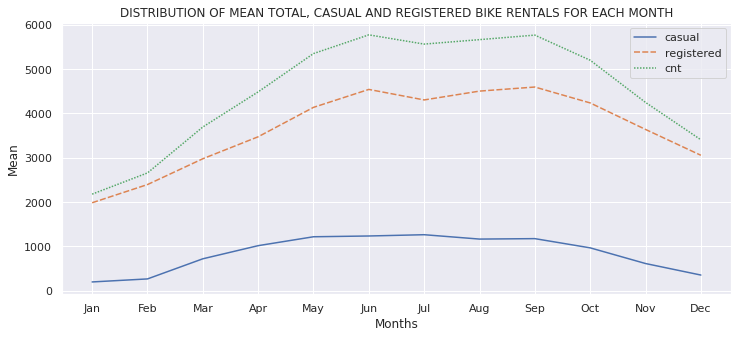

In [ ]:
sns.set(rc={"figure.figsize":(12, 5)})
sns.lineplot(data=casualreg)
plt.xlabel("Months")
plt.ylabel("Mean")
plt.title("DISTRIBUTION OF MEAN TOTAL, CASUAL AND REGISTERED BIKE RENTALS FOR EACH MONTH")
plt.show()

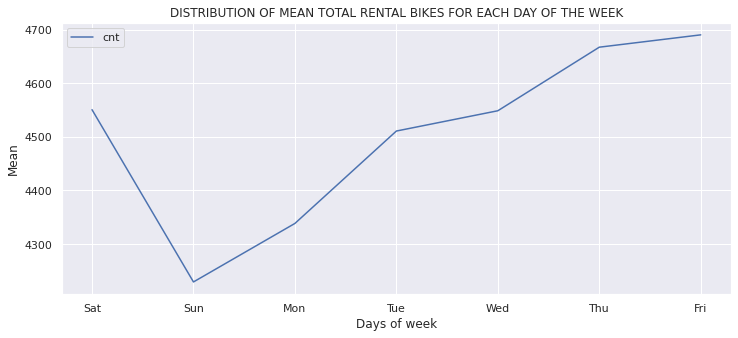

In [ ]:
sns.set(rc={"figure.figsize":(12, 5)})
dayofweek = data.groupby(['weekday'], sort=False)[['cnt']].mean()
dayofweek.head(60)

sns.lineplot(data=dayofweek)
plt.xlabel("Days of week")
plt.ylabel("Mean")
plt.title("DISTRIBUTION OF MEAN TOTAL RENTAL BIKES FOR EACH DAY OF THE WEEK")
plt.show()

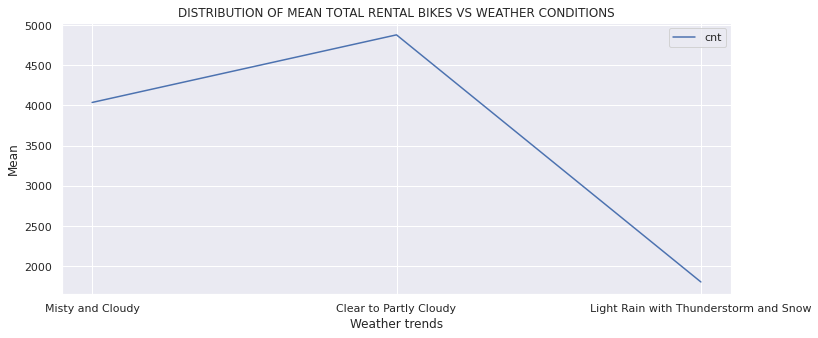

In [ ]:
sns.set(rc={"figure.figsize":(12, 5)})
weather = data.groupby(['weathersit'], sort=False)[['cnt']].mean()
weather.head(60)

sns.lineplot(data=weather)
plt.xlabel("Weather trends")
plt.ylabel("Mean")
plt.title("DISTRIBUTION OF MEAN TOTAL RENTAL BIKES VS WEATHER CONDITIONS")
plt.show()

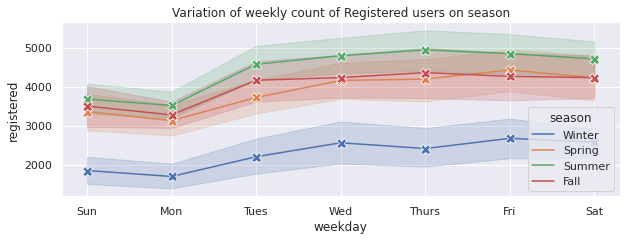

In [ ]:
plt.figure(figsize=(10,3.2))
ax = sns.lineplot(x='weekday', y='registered', data=data, hue='season',marker = 'X', markersize= 10)
ax.set_title('Variation of weekly count of Registered users on season')
sns.set(style="whitegrid")
tick_val=[0, 1, 2, 3, 4, 5, 6]
tick_lab=['Sun', 'Mon', 'Tues', 'Wed', 'Thurs', 'Fri', 'Sat']
plt.xticks(tick_val, tick_lab)
plt.show()

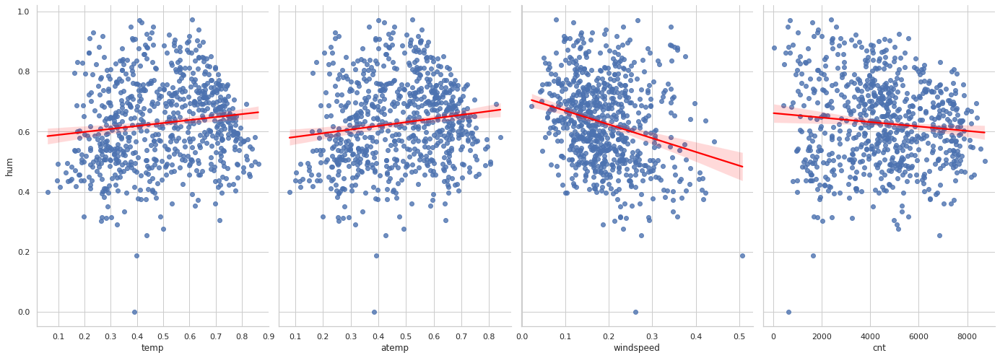

In [ ]:

sns.pairplot(data, x_vars=['temp', 'atemp','windspeed','cnt'], y_vars='hum', size=7, aspect=0.7, kind='reg', plot_kws={'line_kws':{'color':'red'}})

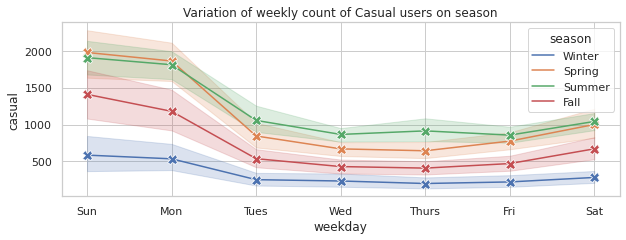

In [ ]:
plt.figure(figsize=(10,3.2))
ax = sns.lineplot(x='weekday', y='casual', data=data, hue='season',marker = 'X', markersize= 10)
ax.set_title('Variation of weekly count of Casual users on season')
sns.set(style="whitegrid")
tick_val=[0, 1, 2, 3, 4, 5, 6]
tick_lab=['Sun', 'Mon', 'Tues', 'Wed', 'Thurs', 'Fri', 'Sat']
plt.xticks(tick_val, tick_lab)
plt.show()

In [ ]:
df = pd.read_csv("/content/day.csv")
df.head()

df = df.drop(columns=['dteday','instant'])

In [ ]:
from sklearn import preprocessing
x=df.drop(['cnt'],axis=1)
y=df['cnt']
x = preprocessing.normalize(x)

In [ ]:
#Splitting the dataset
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.3, random_state = 0)

In [ ]:
#Linear Regression
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score
linearRegressor = LinearRegression()
linearRegressor.fit(x_train, y_train)
y_predicted = linearRegressor.predict(x_test)
mse = mean_squared_error(y_test, y_predicted)
r = r2_score(y_test, y_predicted)
mae = mean_absolute_error(y_test,y_predicted)
print("Linear Regression Model:")
print("Mean Squared Error:",mse)
print("R square:",r)
print("Mean Absolute Error:",mae)

Linear Regression Model:
Mean Squared Error: 2715595.0747490465
R square: 0.3420106093390979
Mean Absolute Error: 1180.1394125669951


In [ ]:
# Random Forest
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier()
rf.fit(x_train,y_train);
y_predicted_r = rf.predict(x_test)
mse = mean_squared_error(y_test, y_predicted_r)
r = r2_score(y_test, y_predicted_r)
mae = mean_absolute_error(y_test,y_predicted_r)
print("Random Forest Model:")
print("Mean Squared Error:",mse)
print("R square:",r)
print("Mean Absolute Error:",mae)

Random Forest Model:
Mean Squared Error: 187408.75454545455
R square: 0.9545908101857646
Mean Absolute Error: 287.26363636363635


In [ ]:
def utils_recognize_type(df, col, max_cat=20):
    if (data[col].dtype == "O") | (data[col].nunique() < max_cat):
        return "cat"
    else:
        return "num"

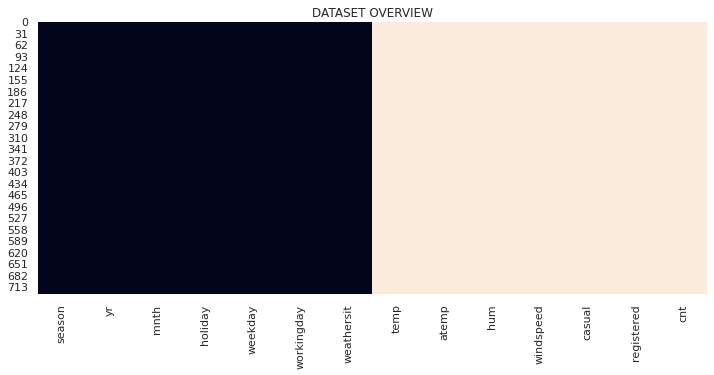

 Categorial   Numeric   NaN 


In [ ]:
dic_cols = {col:utils_recognize_type(df, col, max_cat=20) for col in df.columns}
heatmap = df.isnull()
for k,v in dic_cols.items():
 if v == "num":
   heatmap[k] = heatmap[k].apply(lambda x: 0.5 if x is False else 1)
 else:
   heatmap[k] = heatmap[k].apply(lambda x: 0 if x is False else 1)
sns.heatmap(heatmap, cbar=False).set_title('DATASET OVERVIEW')
plt.show()
print("\033[1;37;40m Categorial ", "\033[1;30;41m Numeric ",  "\033[1;30;47m NaN ")

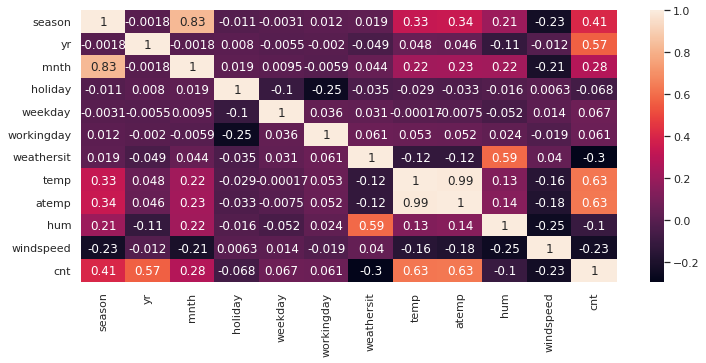

In [ ]:
datacorr = df.drop(columns = ['registered', 'casual'])

sns.heatmap(datacorr.corr(), annot=True)
plt.show()

In [ ]:
bike_new=df[['season', 'yr', 'mnth', 'holiday', 'weekday',
       'workingday', 'weathersit', 'temp', 'atemp', 'hum', 'windspeed',
       'cnt']]

In [ ]:
bike_new.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 731 entries, 0 to 730
Data columns (total 12 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   season      731 non-null    int64  
 1   yr          731 non-null    int64  
 2   mnth        731 non-null    int64  
 3   holiday     731 non-null    int64  
 4   weekday     731 non-null    int64  
 5   workingday  731 non-null    int64  
 6   weathersit  731 non-null    int64  
 7   temp        731 non-null    float64
 8   atemp       731 non-null    float64
 9   hum         731 non-null    float64
 10  windspeed   731 non-null    float64
 11  cnt         731 non-null    int64  
dtypes: float64(4), int64(8)
memory usage: 68.7 KB


In [ ]:
# Convert to 'category' data type

bike_new['season']=bike_new['season'].astype('category')
bike_new['weathersit']=bike_new['weathersit'].astype('category')
bike_new['mnth']=bike_new['mnth'].astype('category')
bike_new['weekday']=bike_new['weekday'].astype('category')

In [ ]:
# This code does 3 things:
# 1) Create Dummy variable
# 2) Drop original variable for which the dummy was created
# 3) Drop first dummy variable for each set of dummies created.

bike_new = pd.get_dummies(bike_new, drop_first=True)
bike_new.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 731 entries, 0 to 730
Data columns (total 30 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   yr            731 non-null    int64  
 1   holiday       731 non-null    int64  
 2   workingday    731 non-null    int64  
 3   temp          731 non-null    float64
 4   atemp         731 non-null    float64
 5   hum           731 non-null    float64
 6   windspeed     731 non-null    float64
 7   cnt           731 non-null    int64  
 8   season_2      731 non-null    uint8  
 9   season_3      731 non-null    uint8  
 10  season_4      731 non-null    uint8  
 11  mnth_2        731 non-null    uint8  
 12  mnth_3        731 non-null    uint8  
 13  mnth_4        731 non-null    uint8  
 14  mnth_5        731 non-null    uint8  
 15  mnth_6        731 non-null    uint8  
 16  mnth_7        731 non-null    uint8  
 17  mnth_8        731 non-null    uint8  
 18  mnth_9        731 non-null    

In [ ]:
from sklearn.model_selection import train_test_split
import numpy as np

# We should specify 'random_state' so that the train and test data set always have the same rows, respectively

np.random.seed(0)
df_train, df_test = train_test_split(bike_new, train_size = 0.70, test_size = 0.30, random_state = 333)

In [ ]:
df_train.shape

(511, 30)

In [ ]:
df_test.shape

(220, 30)

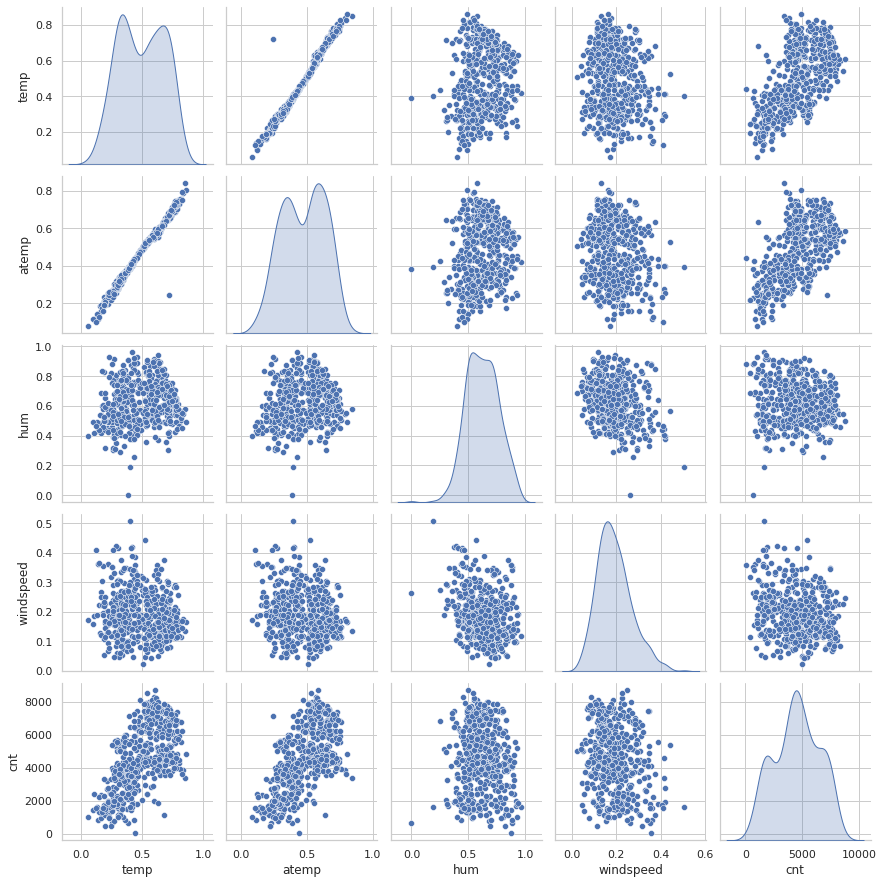

In [ ]:
# Create a new dataframe of only numeric variables:

bike_num=df_train[[ 'temp', 'atemp', 'hum', 'windspeed','cnt']]

sns.pairplot(bike_num, diag_kind='kde')
plt.show()

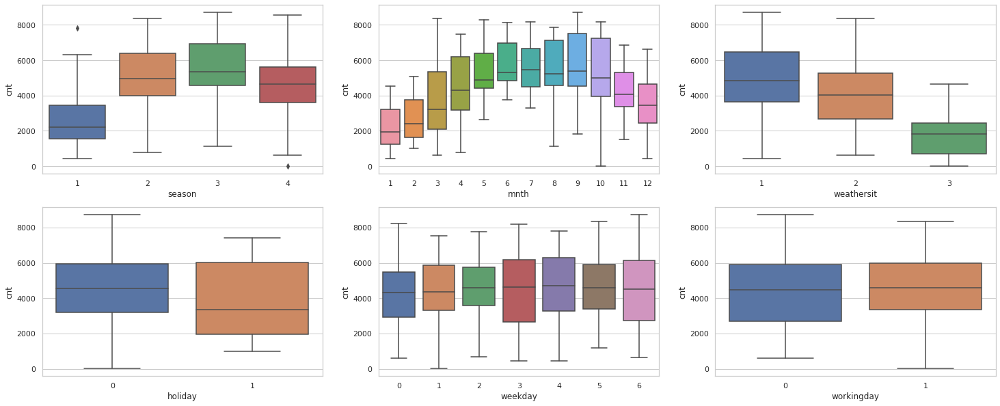

In [ ]:
# Build boxplot of all categorical variables (before creating dummies) againt the target variable 'cnt' 
# to see how each of the predictor variable stackup against the target variable.

plt.figure(figsize=(25, 10))
plt.subplot(2,3,1)
sns.boxplot(x = 'season', y = 'cnt', data = df)
plt.subplot(2,3,2)
sns.boxplot(x = 'mnth', y = 'cnt', data = df)
plt.subplot(2,3,3)
sns.boxplot(x = 'weathersit', y = 'cnt', data = df)
plt.subplot(2,3,4)
sns.boxplot(x = 'holiday', y = 'cnt', data = df)
plt.subplot(2,3,5)
sns.boxplot(x = 'weekday', y = 'cnt', data = df)
plt.subplot(2,3,6)
sns.boxplot(x = 'workingday', y = 'cnt', data = df)
plt.show()

In [ ]:
df.columns

Index(['season', 'yr', 'mnth', 'holiday', 'weekday', 'workingday',
       'weathersit', 'temp', 'atemp', 'hum', 'windspeed', 'casual',
       'registered', 'cnt'],
      dtype='object')

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split

train = df.drop(['registered', 'casual'], axis=1)

In [ ]:
test =df['cnt']

In [ ]:
x_train, x_test, y_train, y_test = train_test_split(train, test, test_size=0.3, random_state=2) 

In [ ]:
regr = LinearRegression()

In [ ]:
regr.fit(x_train, y_train)

LinearRegression()

In [ ]:
pred= regr.predict(x_test)

In [ ]:
pred

array([5847., 4541., 3117., 3820., 1712., 1996., 8294., 5302., 3310.,
       3761., 4521.,  986., 1495., 8555.,  623., 3873., 3846., 4911.,
       7216., 6230., 8090., 4507., 4634., 1204., 1501., 7865., 3392.,
       7335., 3204., 6597., 5319., 1543., 4649., 4381., 5668., 3544.,
       2192., 3727., 6043., 4803., 5382., 7384., 1650., 7499., 7870.,
       4068., 7444., 5260., 3487., 2395., 4456., 3811., 3747., 1944.,
       3429., 6864.,  801., 7129., 5875., 7907., 6421., 2432., 3005.,
       7639., 4725., 3214., 6824., 5409., 2703., 4672.,  705., 5499.,
       4401., 7350., 3944., 7421., 3840., 5008., 4067., 4717., 7572.,
       4362., 6290., 5202., 1685., 3922., 5424., 4996., 8173., 5740.,
       4066., 4195., 4833., 3456., 4660., 7328., 6883., 7333., 1891.,
       7736., 3956., 6203., 3368., 7415., 4274., 4378., 3372., 7424.,
       7498., 3272., 6133., 4266., 2496., 1461., 8167., 6978., 3855.,
       4367., 6196., 4549., 2424., 4891., 5255., 7836., 5495., 3194.,
       4845., 4492.,

In [ ]:
regr.score(x_test, y_test)

1.0

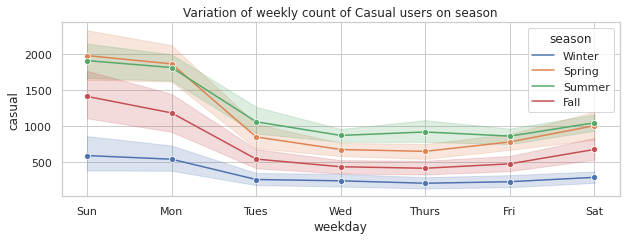

In [ ]:
plt.figure(figsize=(10,3.2))
ax = sns.lineplot(x='weekday', y='casual', data=data, hue='season',marker = 'o')
ax.set_title('Variation of weekly count of Casual users on season')
sns.set(style="whitegrid")
tick_val=[0, 1, 2, 3, 4, 5, 6]
tick_lab=['Sun', 'Mon', 'Tues', 'Wed', 'Thurs', 'Fri', 'Sat']
plt.xticks(tick_val, tick_lab)
plt.show()

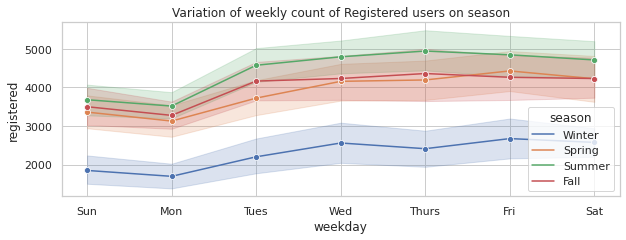

In [ ]:
plt.figure(figsize=(10,3.2))
ax = sns.lineplot(x='weekday', y='registered', data=data, hue='season',marker = 'o')
ax.set_title('Variation of weekly count of Registered users on season')
sns.set(style="whitegrid")
tick_val=[0, 1, 2, 3, 4, 5, 6]
tick_lab=['Sun', 'Mon', 'Tues', 'Wed', 'Thurs', 'Fri', 'Sat']
plt.xticks(tick_val, tick_lab)
plt.show()

In [ ]:
df_melted = data.melt(id_vars=['dteday','season','weekday'], value_vars=['registered', 'casual'], value_name='users')
df_melted

,dteday,season,weekday,variable,users
0,2011-01-01,Winter,Sat,registered,654
1,2011-01-02,Winter,Sun,registered,670
2,2011-01-03,Winter,Mon,registered,1229
3,2011-01-04,Winter,Tue,registered,1454
4,2011-01-05,Winter,Wed,registered,1518
...,...,...,...,...,...
1457,2012-12-27,Winter,Thu,casual,247
1458,2012-12-28,Winter,Fri,casual,644
1459,2012-12-29,Winter,Sat,casual,159
1460,2012-12-30,Winter,Sun,casual,364


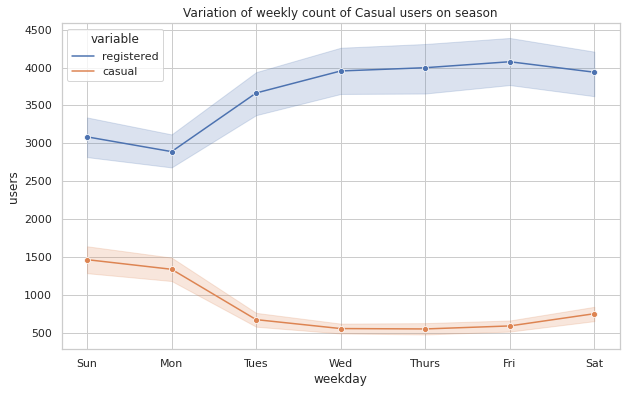

In [ ]:
plt.figure(figsize=(10,6))
ax = sns.lineplot(x='weekday', y='users', data=df_melted, hue='variable',marker = 'o')
ax.set_title('Variation of weekly count of Casual users on season')
sns.set(style="whitegrid")
tick_val=[0, 1, 2, 3, 4, 5, 6]
tick_lab=['Sun', 'Mon', 'Tues', 'Wed', 'Thurs', 'Fri', 'Sat']
plt.xticks(tick_val, tick_lab)
plt.show()

In [ ]:
df_joined = df_melted.melt(id_vars=['dteday','weekday','users'], value_vars=['season', 'variable'])
df_joined

,dteday,weekday,users,variable,value
0,2011-01-01,Sat,654,season,Winter
1,2011-01-02,Sun,670,season,Winter
2,2011-01-03,Mon,1229,season,Winter
3,2011-01-04,Tue,1454,season,Winter
4,2011-01-05,Wed,1518,season,Winter
...,...,...,...,...,...
2919,2012-12-27,Thu,247,variable,casual
2920,2012-12-28,Fri,644,variable,casual
2921,2012-12-29,Sat,159,variable,casual
2922,2012-12-30,Sun,364,variable,casual


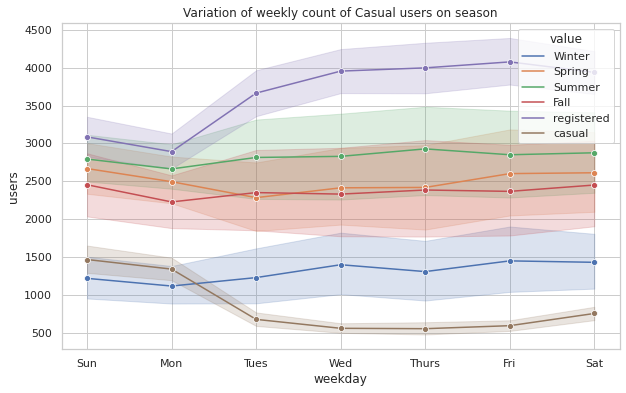

In [ ]:
plt.figure(figsize=(10,6))
ax = sns.lineplot(x='weekday', y='users', data=df_joined, hue='value',marker = 'o')
ax.set_title('Variation of weekly count of Casual users on season')
sns.set(style="whitegrid")
tick_val=[0, 1, 2, 3, 4, 5, 6]
tick_lab=['Sun', 'Mon', 'Tues', 'Wed', 'Thurs', 'Fri', 'Sat']
plt.xticks(tick_val, tick_lab)
plt.show()

In [ ]:
alldata = df_melted.groupby(['season', 'variable'])
alldata.head(40)

,dteday,season,weekday,variable,users
0,2011-01-01,Winter,Sat,registered,654
1,2011-01-02,Winter,Sun,registered,670
2,2011-01-03,Winter,Mon,registered,1229
3,2011-01-04,Winter,Tue,registered,1454
4,2011-01-05,Winter,Wed,registered,1518
...,...,...,...,...,...
1031,2011-10-28,Fall,Fri,casual,456
1032,2011-10-29,Fall,Sat,casual,57
1033,2011-10-30,Fall,Sun,casual,885
1034,2011-10-31,Fall,Mon,casual,362


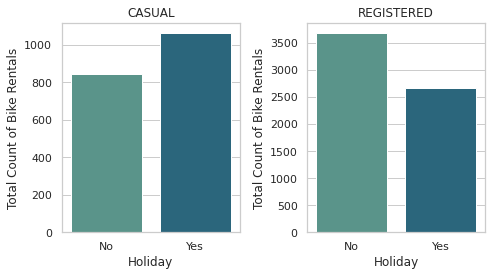

In [ ]:
user_var = ['casual','registered']

fig, ax= plt.subplots(nrows=1, ncols=len(user_var), figsize=(7,4))
for i in range(len(user_var)):
  sns.barplot(y=data.groupby(by='holiday').mean()[user_var[i]],
              x=data.groupby(by='holiday').mean().index,
              ax=ax[i], palette='crest')
  ax[i].set_title(f'{user_var[i].upper()}')
  ax[i].set_ylabel('Total Count of Bike Rentals')
  ax[i].set_xlabel('Holiday')
  

plt.tight_layout()
plt.show()

In [ ]:
import warnings
warnings.filterwarnings('ignore')
import statsmodels
# import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import RFE
from sklearn.metrics import r2_score
pd.set_option('display.float_format', lambda x:'%.5f' % x)


df = pd.read_csv("/content/day.csv")
df.head()

,instant,dteday,season,yr,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,2011-01-01,1,0,1,0,6,0,2,0.34417,0.36362,0.80583,0.16045,331,654,985
1,2,2011-01-02,1,0,1,0,0,0,2,0.36348,0.35374,0.69609,0.24854,131,670,801
2,3,2011-01-03,1,0,1,0,1,1,1,0.19636,0.18940,0.43727,0.24831,120,1229,1349
3,4,2011-01-04,1,0,1,0,2,1,1,0.20000,0.21212,0.59044,0.16030,108,1454,1562
4,5,2011-01-05,1,0,1,0,3,1,1,0.22696,0.22927,0.43696,0.18690,82,1518,1600


In [ ]:
df_melted = df.melt(id_vars=['dteday','season','weekday'], value_vars=['registered', 'casual'], value_name='users')
df_melted

,dteday,season,weekday,variable,users
0,2011-01-01,1,6,registered,654
1,2011-01-02,1,0,registered,670
2,2011-01-03,1,1,registered,1229
3,2011-01-04,1,2,registered,1454
4,2011-01-05,1,3,registered,1518
...,...,...,...,...,...
1457,2012-12-27,1,4,casual,247
1458,2012-12-28,1,5,casual,644
1459,2012-12-29,1,6,casual,159
1460,2012-12-30,1,0,casual,364


In [ ]:
alldata = df_melted.groupby(['season', 'variable'])[['dteday', 'weekday', 'users']]
alldata.head(60)

,dteday,weekday,users
0,2011-01-01,6,654
1,2011-01-02,0,670
2,2011-01-03,1,1229
3,2011-01-04,2,1454
4,2011-01-05,3,1518
...,...,...,...
1051,2011-11-17,4,139
1052,2011-11-18,5,245
1053,2011-11-19,6,943
1054,2011-11-20,0,787


In [ ]:
df = df.drop(columns=['dteday','instant'])

from sklearn import preprocessing
x=df.drop(['cnt'],axis=1)
y=df['cnt']
x = preprocessing.normalize(x)




#Splitting the dataset
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.3, random_state = 0)
x_train.shape

(511, 13)

In [ ]:
from sklearn.linear_model import Lasso, ElasticNet, Ridge, SGDRegressor
from sklearn.svm import SVR, NuSVR
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score
from sklearn.ensemble import BaggingRegressor, RandomForestRegressor
from sklearn.neighbors import KNeighborsClassifier
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from prettytable import PrettyTable
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
table = PrettyTable()
table.field_names = ["Model Built", "Mean Square Error", "R-square value","Mean Absolute Error"]
models = [
LinearRegression(),
RandomForestRegressor( random_state=0, n_estimators=300),

]
for model in models:
  model.fit(x_train, y_train)
  y_res = model.predict(x_test)
  mse = mean_squared_error(y_test, y_res)
  score = model.score(x_test, y_test)
  mae = mean_absolute_error(y_test,y_res)
  table.add_row([type(model).__name__, format(mse, '.2f'), format(score, '.2f'),format(mae, '.2f')])
print(table)

+-----------------------+-------------------+----------------+---------------------+
|      Model Built      | Mean Square Error | R-square value | Mean Absolute Error |
+-----------------------+-------------------+----------------+---------------------+
|    LinearRegression   |     2139119.50    |      0.39      |       1236.69       |
| RandomForestRegressor |     2774247.63    |      0.21      |       1362.61       |
+-----------------------+-------------------+----------------+---------------------+


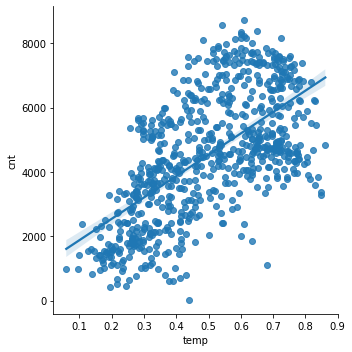

In [ ]:
import warnings
warnings.filterwarnings('ignore')
import statsmodels
# import statsmodels.api as sm
import pandas as pd
import seaborn as sns
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import RFE
from sklearn.metrics import r2_score
pd.set_option('display.float_format', lambda x:'%.5f' % x)


df = pd.read_csv("/content/day.csv")
df.head()
sns.lmplot(x = 'temp', y = 'cnt', data = df)

In [ ]:
X = df[['temp', 'hum', 'windspeed']]
X.head()

,temp,hum,windspeed
0,0.34417,0.80583,0.16045
1,0.36348,0.69609,0.24854
2,0.19636,0.43727,0.24831
3,0.20000,0.59044,0.16030
4,0.22696,0.43696,0.18690


In [ ]:
y = df['cnt']
y.head()

0     985
1     801
2    1349
3    1562
4    1600
Name: cnt, dtype: int64

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)

from sklearn.linear_model import LinearRegression
lm = LinearRegression()
lm.fit(X_train,y_train)


LinearRegression()

In [ ]:
lm.coef_


array([ 6626.64250654, -3048.62539906, -4844.67623723])

In [ ]:
predictions = lm.predict(X_test)

Text(0, 0.5, 'Predicted Y')

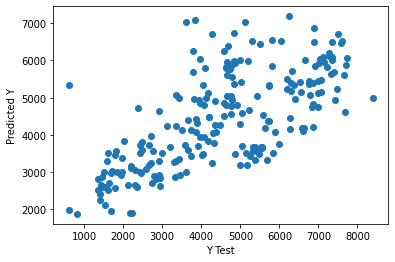

In [ ]:
plt.scatter(x = y_test, y = predictions)
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')

In [ ]:
from sklearn import metrics
from math import sqrt

print('MAE:', 
      metrics.mean_absolute_error(y_test, predictions), ' ',
      (1./len(y_test))*(sum(abs(y_test-predictions))))
print('MSE:', 
      metrics.mean_squared_error(y_test, predictions), ' ',
      (1./len(y_test))*(sum((y_test-predictions)**2)))
print('RMSE:', 
      np.sqrt(metrics.mean_squared_error(y_test, predictions)), ' ',
      sqrt((1./len(y_test))*(sum((y_test-predictions)**2))))

MAE: 1119.1186092609162   1119.1186092609157
MSE: 1827837.5502481596   1827837.550248158
RMSE: 1351.975425164289   1351.9754251642883


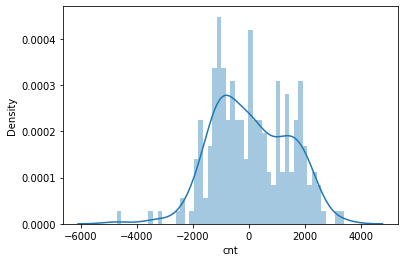

In [ ]:
sns.distplot((y_test-predictions), bins = 50)

In [ ]:
df = pd.DataFrame( data = lm.coef_, columns = ['Coefficient'] ,index = X_train.columns)
df.head()

,Coefficient
temp,6626.64251
hum,-3048.62540
windspeed,-4844.67624


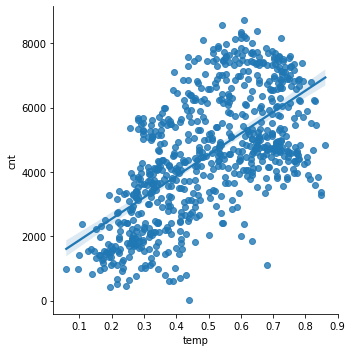

In [ ]:
import warnings
warnings.filterwarnings('ignore')
import statsmodels
# import statsmodels.api as sm
import pandas as pd
import seaborn as sns
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import RFE
from sklearn.metrics import r2_score
pd.set_option('display.float_format', lambda x:'%.5f' % x)


df = pd.read_csv("/content/day.csv")
df.head()
sns.lmplot(x = 'temp', y = 'cnt', data = df)

x = df.iloc[:,9].values.reshape(-1,1)

In [ ]:
y=df.iloc[:,15].values.reshape(-1,1)

In [ ]:
lr = LinearRegression()

In [ ]:
lr.fit(x,y)

LinearRegression()

In [ ]:
y_pred = lr.predict(x)

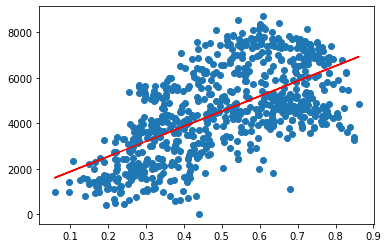

In [ ]:
plt.scatter(x,y)
plt.plot(x,y_pred, color='red')
plt.show()

In [ ]:

r2_score = r2_score(x,y)

In [ ]:
x = df.iloc[:,9].values.reshape(-1,1)
y=df.iloc[:,15].values.reshape(-1,1)

# x= df['temp']
# y = df['cnt']


In [ ]:
x.shape, y.shape

((731, 1), (731, 1))

In [ ]:
x_train, x_test, y_train,y_test = train_test_split(x,y,test_size=0.2)

In [ ]:
x_train.shape, y_train.shape

((584, 1), (584, 1))

In [ ]:
x_test.shape, y_test.shape

((147, 1), (147, 1))

In [ ]:
model = LinearRegression()
model.fit(x_train, y_train)
import numpy as np

In [ ]:
y_pred = model.predict(x_test)

In [ ]:
print('r2_score: %.2f' % r2_score(y_test, y_pred))

r2_score: 0.44


In [ ]:
import warnings
warnings.filterwarnings('ignore')
import statsmodels
# import statsmodels.api as sm
import pandas as pd
import seaborn as sns
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import RFE
from sklearn.metrics import r2_score
pd.set_option('display.float_format', lambda x:'%.5f' % x)


df = pd.read_csv("/content/day.csv")
df.head()

,instant,dteday,season,yr,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,2011-01-01,1,0,1,0,6,0,2,0.34417,0.36362,0.80583,0.16045,331,654,985
1,2,2011-01-02,1,0,1,0,0,0,2,0.36348,0.35374,0.69609,0.24854,131,670,801
2,3,2011-01-03,1,0,1,0,1,1,1,0.19636,0.18940,0.43727,0.24831,120,1229,1349
3,4,2011-01-04,1,0,1,0,2,1,1,0.20000,0.21212,0.59044,0.16030,108,1454,1562
4,5,2011-01-05,1,0,1,0,3,1,1,0.22696,0.22927,0.43696,0.18690,82,1518,1600


In [ ]:
x = df.iloc[:,10].values.reshape(-1,1)
y=df.iloc[:,15].values.reshape(-1,1)
x_train, x_test, y_train,y_test = train_test_split(x,y,test_size=0.2)
x_train.shape, y_train.shape

((584, 1), (584, 1))

In [ ]:
mod = LinearRegression()
mod.fit(x_train, y_train)
import numpy as np
y_pred = mod.predict(x_test)
print('r2_score: %.2f' % r2_score(y_test, y_pred))

r2_score: 0.33


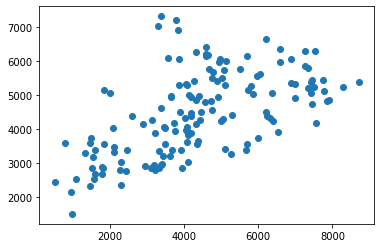

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


plt.scatter(y_test, y_pred)
# plt.plot(x_test, y_pred)
plt.show()

0.33207803803151625

# New Section

In [ ]:
mean_absolute_error(y_test,y_res)

1362.606368552712

In [ ]:
!pip install pandas-profiling[notebook,html]

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import pandas as pd
import pandas_profiling
from pandas_profiling import ProfileReport
from pandas_profiling.utils.cache import cache_file

ModuleNotFoundError: ignored

In [ ]:
pip install pandas-profiling[notebook,html]

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import pandas as pd
import pandas_profiling
from pandas_profiling import ProfileReport

In [ ]:
profile = ProfileReport(data)

TypeError: ignored

In [ ]:
! pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip 


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     / 21.9 MB 144 kB/s
     |████████████████████████████████| 596 kB 2.8 MB/s 
     |████████████████████████████████| 102 kB 41.2 MB/s 
     |████████████████████████████████| 690 kB 35.2 MB/s 
     |████████████████████████████████| 4.7 MB 36.4 MB/s 
     |████████████████████████████████| 62 kB 1.2 MB/s 
     |████████████████████████████████| 812 kB 52.0 MB/s 
  Created wheel for pandas-profiling: filename=pandas_profiling-3.2.0-py2.py3-none-any.whl size=261257 sha256=4f03594e685711c3263d11b04650443ecc30548f3a5452fda4ba6ca349402ce7
  Stored in directory: /tmp/pip-ephem-wheel-cache-egcqku4_/wheels/cc/d5/09/083fb07c9363a2f45854b0e3a7de7d7c560f07da74b9e9769d
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27098 sha256=efc09c5e28413c7d81878564c4317ea345ca7fa069cec6d27b91b51e5b3c2d7c
  Stored in directory: /root/.cache/pip/wheels/70/e1/52/5b14d250ba868768823940

In [ ]:
import pandas as pd
import pandas_profiling
from pandas_profiling import ProfileReport

In [ ]:

data = pd.read_csv("/content/day.csv")

In [ ]:
profile = ProfileReport(data, title='Report')

In [ ]:
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]